In [2]:
from pylab import *
from scipy.integrate import *
%matplotlib inline

# Problema 1

## a)

Tenemos que en (mod $2\pi$):

$\theta= \theta_0 + \omega t$

Sabemos tambien que:

$\dot{\theta} = \omega = \frac{p}{mR^2}$

entonces:

$\theta = \theta_0 +\frac{p}{mR^2}t $

Si lo extendemos a $i+1$ en  tenemos entonces:

$\theta_{i+1} = \theta_i +\frac{p_{i+1}}{mR^2}t$

De igual forma sabemos que el cambio en la cantidad de movimiento esta dada por:

$\Delta p = \epsilon cos \theta$

Si lo extendemos a $i+1$ tendriamos que:

$\Delta p_{i+1} = \epsilon cos \theta_i$

Podemos ver a $\Delta p_{i+1} = p_{i+1}-\Delta p$ por lo que tendriamos:

$\Delta p = p_i + \epsilon cos \theta_i$

Despejando $ p_{i+1}$ tendriamos:

$ p_{i+1} = p_{i} + \epsilon cos \theta_i$




## b)

Definimos dos funciones: una que nos da la ecuacion de movimiento y otra para definir las condiciones iniciales. En este caso la ecuación de movimiento la tenemos en terminos de $\theta$ y de $\Delta p$ una es en el caso en el que no tenemos una perturbación y la otra cuando tenemos perturbación. Ambas son las que vimos en el caso anterior.

In [3]:
def ec_mov(th_p,tau,epsilon):
    p1 = th_p[1]+epsilon*cos(th_p[0])
    th1 = th_p[0]+p1*tau
    return array([th1,p1])

def condiciones(limite):
    ang = 2*pi*rand()
    p = (1-rand())*pi/2
    return array([ang,p])

Ahora vamos a realizar el algoritmo que nos permita hacer las curvas del plano $(\theta, p)$ para cuando $\epsilon = 0$

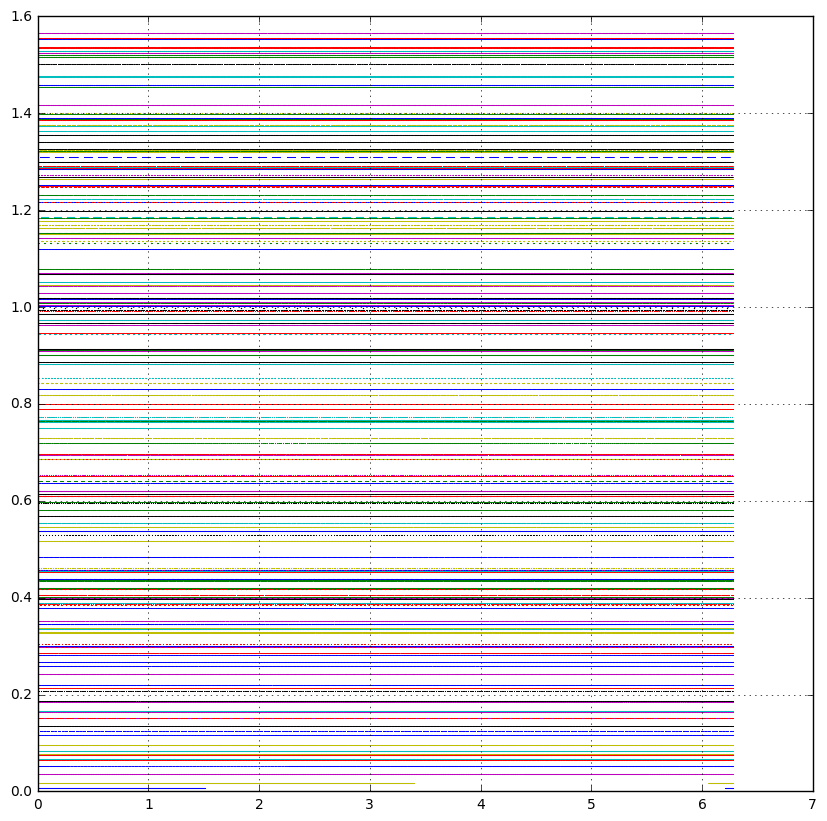

In [4]:
tau = .1
t = arange(0,200,tau)
epsilon = 0

grafica =subplots(figsize=(10, 10))
grid(True)

for i in range(200):
    
        pto = condiciones(pi/2)
        #plot(pto[0],pto[1],'o')
        sol = zeros([len(t),2])
        sol[0] = pto
        for j in range(len(t)-1):
            pto_ini = sol[j]
            sol[j+1]= ec_mov(sol[j],tau,epsilon)
            if sol[j+1][0]>=(2*pi):
                 sol[j+1][0]=sol[j+1][0]%(2*pi)
            if sol[j+1][0]<0:
                sol[j+1][0] = 2*pi+sol[j+1][0] 
        theta = [row[0] for row in sol]
        p = [row[1] for row in sol]
        plot(theta,p,'.',markersize = 0.5)
show()

Como podemos observar, el resultado son rectas. Esto se debe a que desde un proncipio podemos ver que tanto $\theta$ como $p$ son constantes. Por lo que al tener $\epsilon=0$ el valor no cambia y permanecen contantes.

## c)

Para que podamos tener que $\theta_i=\theta_{i+1}$ con $\epsilon \neq 0$ necesitamos que  $p_{i+1}= 0$ por lo que $p_i= - \epsilon cos \theta_i$. Pero igualmente necesitamos que $p_{i+1}= p_i$, por lo que el primer punto fijo será $p_i=0$ y el segundo será una $\theta_i$ tal que $cos\theta_i=0$ por lo que el segundo punto fijo es $\theta_i= \frac{\pi}{2}$ y multiplos de este. 

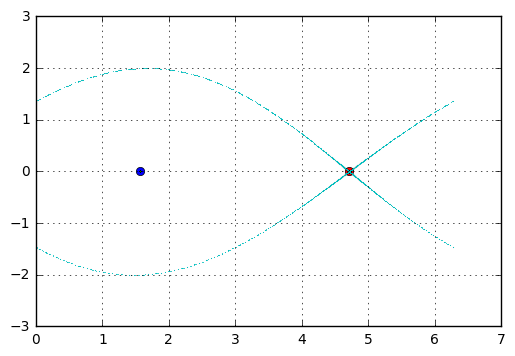

In [5]:
t_ini= array([pi/2,4.71238898038469])  # angulos iniciales
tau = .1
t = arange(0,1000,tau)
epsilon= .1
for i in range(len(t_ini)):
    
        grid(True)
    
        
        pto = [t_ini[i],0]
        plot(pto[0],pto[1],'o')
        sol = zeros([len(t),2])
        sol[0] = pto
        for j in range(len(t)-1):
            sol[j+1]= ec_mov(sol[j],tau,epsilon)
            if sol[j+1][0]>=(2*pi):
                 sol[j+1][0]=sol[j+1][0]%(2*pi)
            if sol[j+1][0]<0:
                sol[j+1][0] = 2*pi+sol[j+1][0] 
        theta = [row[0] for row in sol]
        p = [row[1] for row in sol]
        plot(theta,p,'.',markersize = 0.5)
show()

Lo que nos dice es que si el sistema se encuantra en un punto fijo entonces si el sistema evoluciona con una perturbación entonces la partícula quedará estatica y con $p=0$.

## d)

A continuación se muestran lo que se obtuvo utilizando valores para epsilon $\epsilon = 0.01,0.05,0.1,0.2,0.3,0.4,0.7, 1.1$ respectivamente

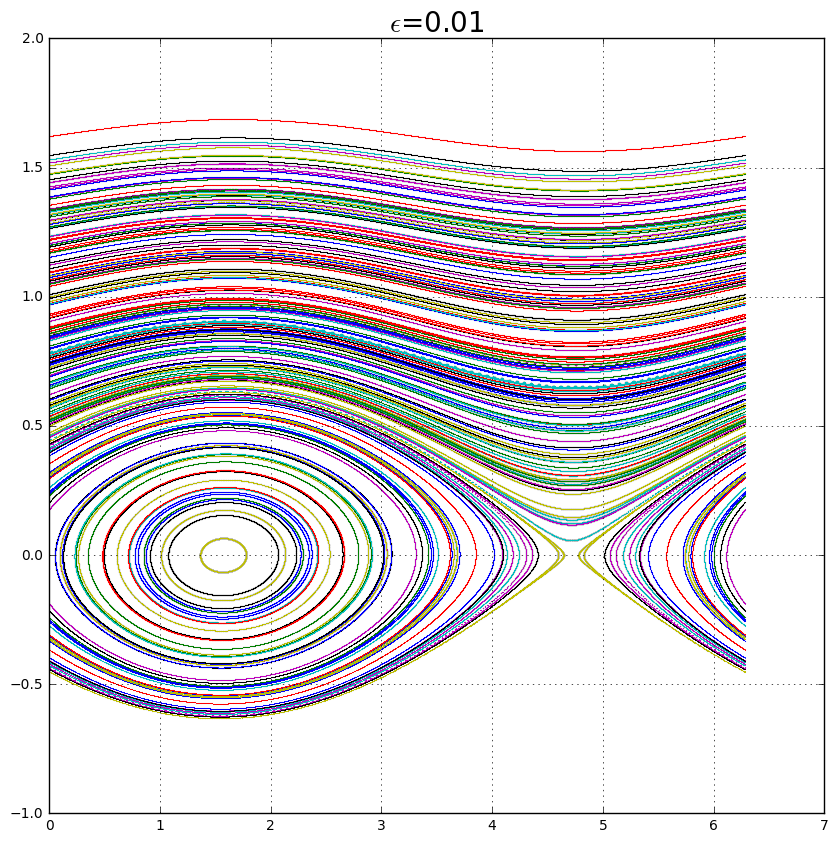

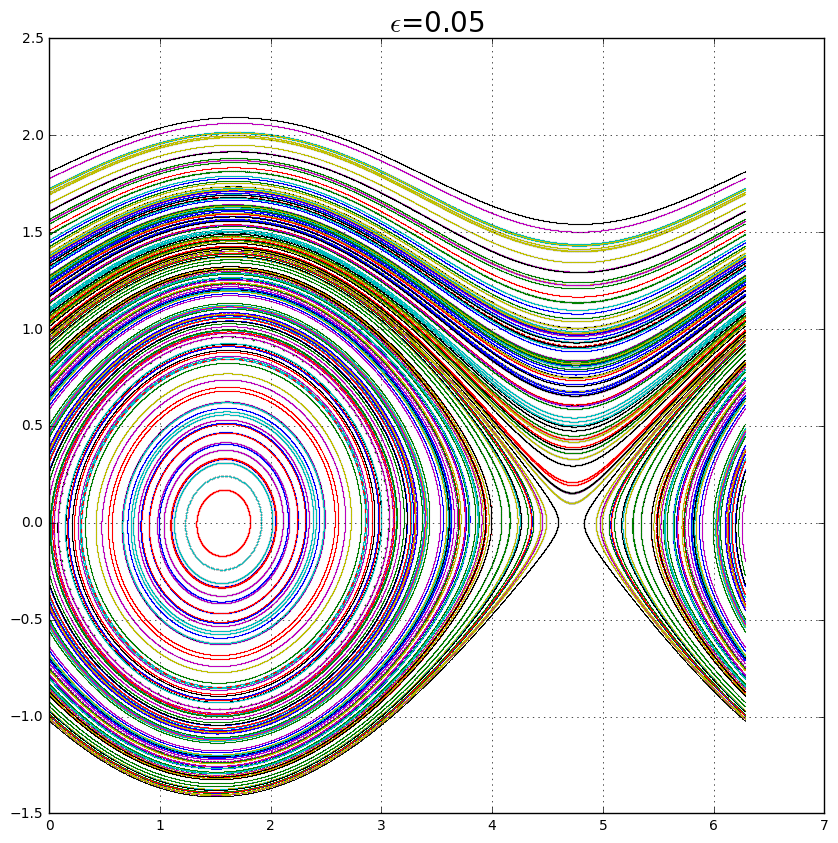

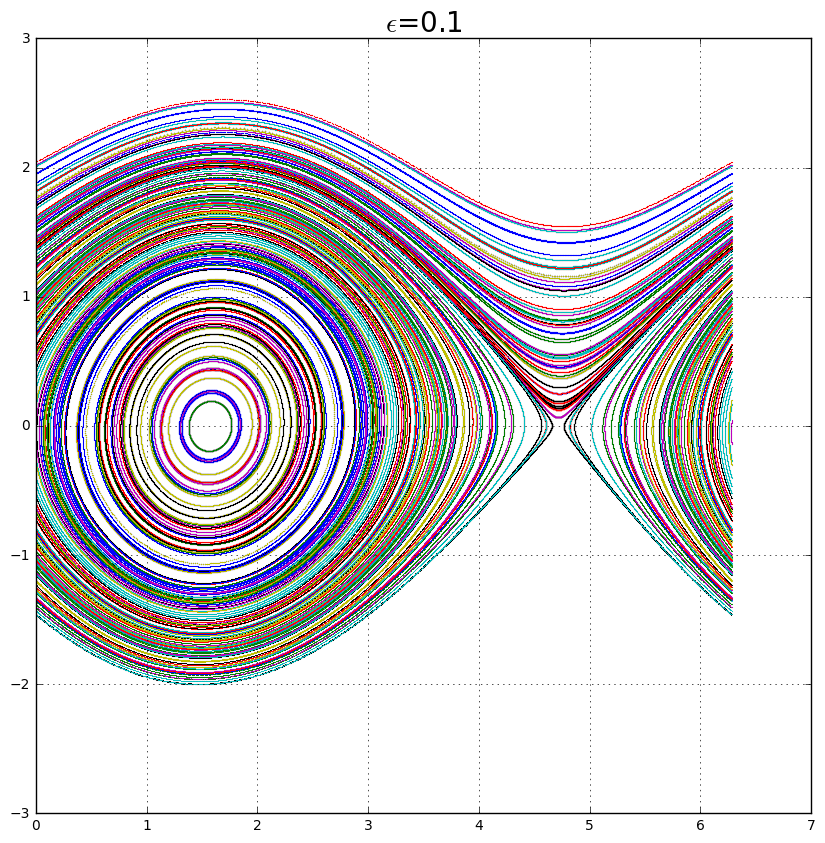

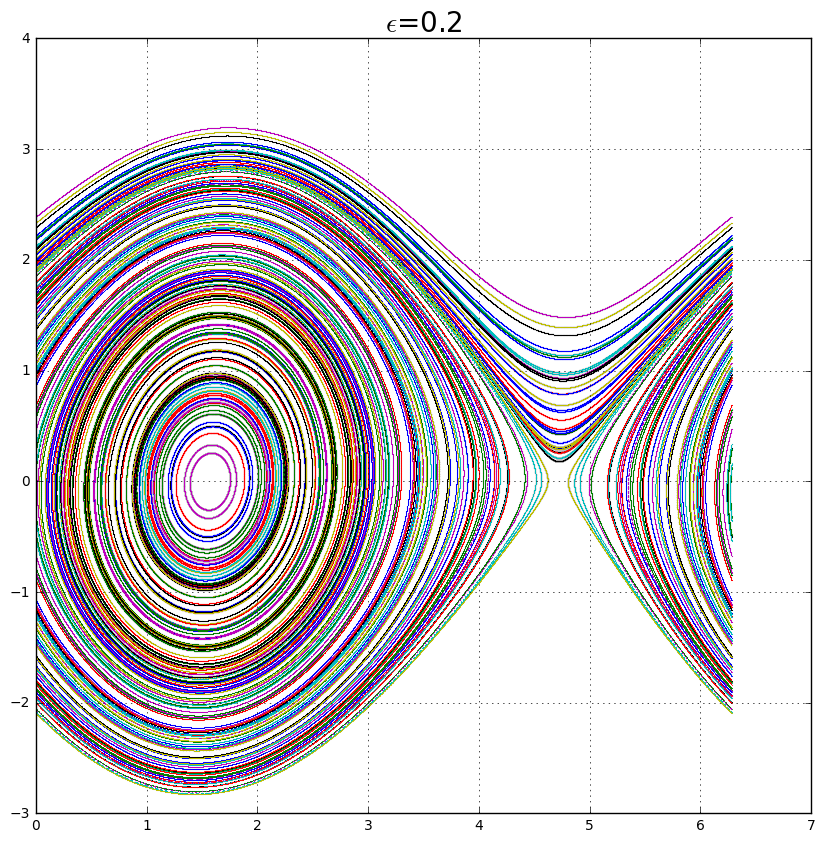

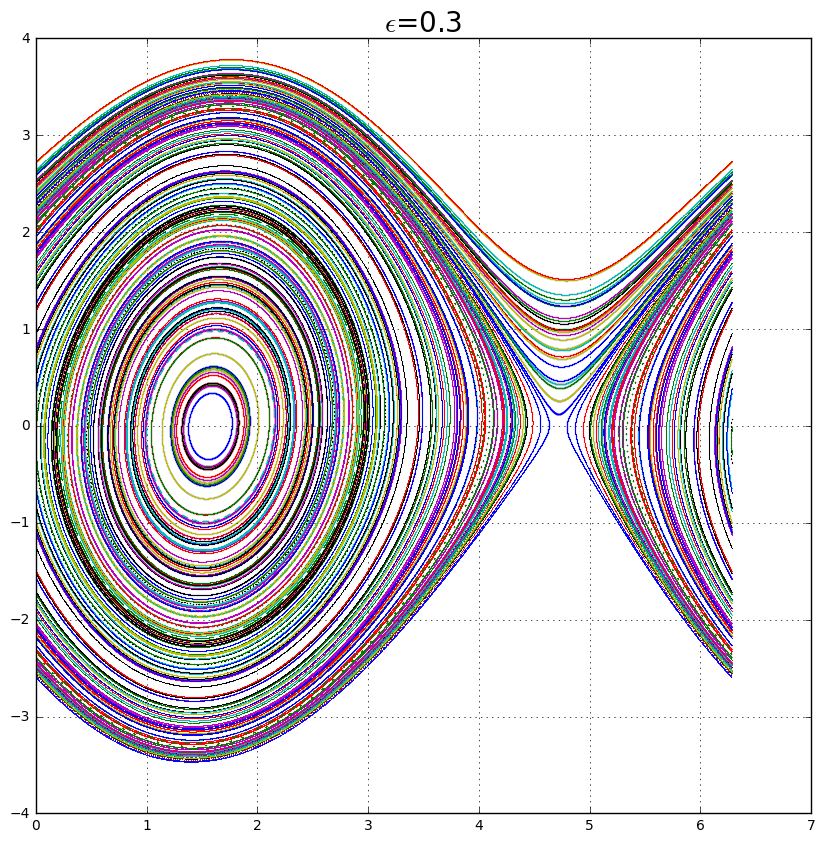

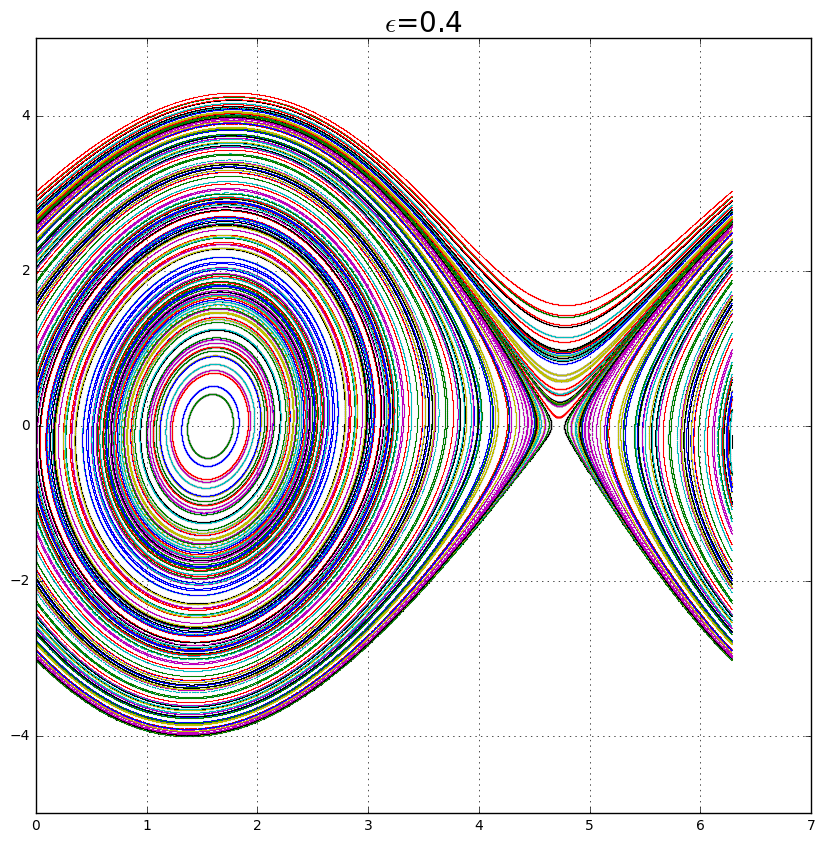

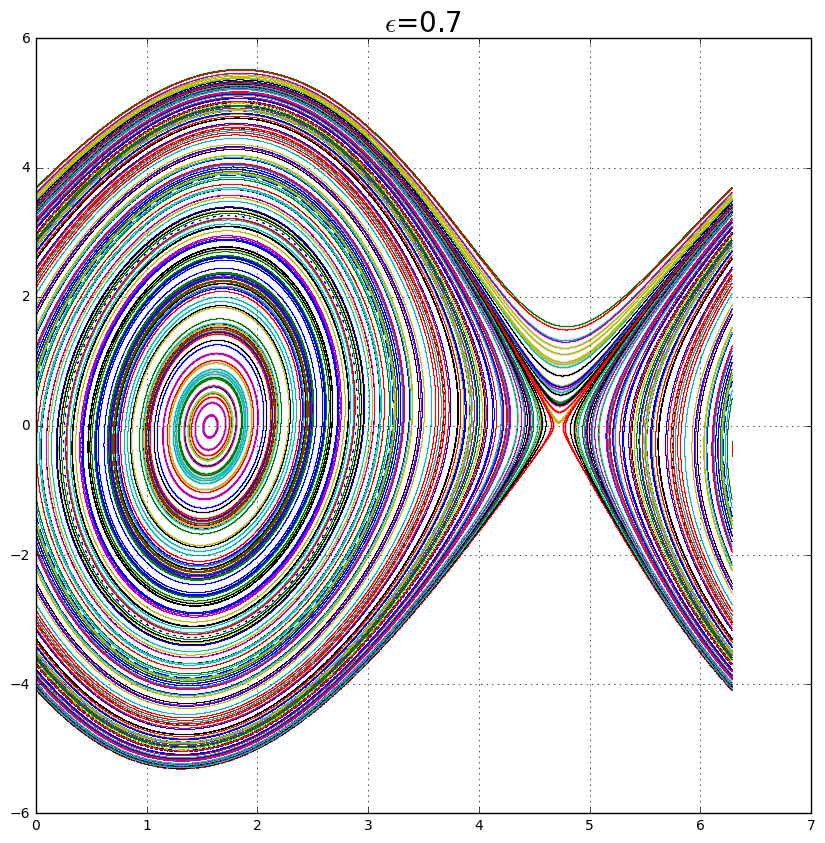

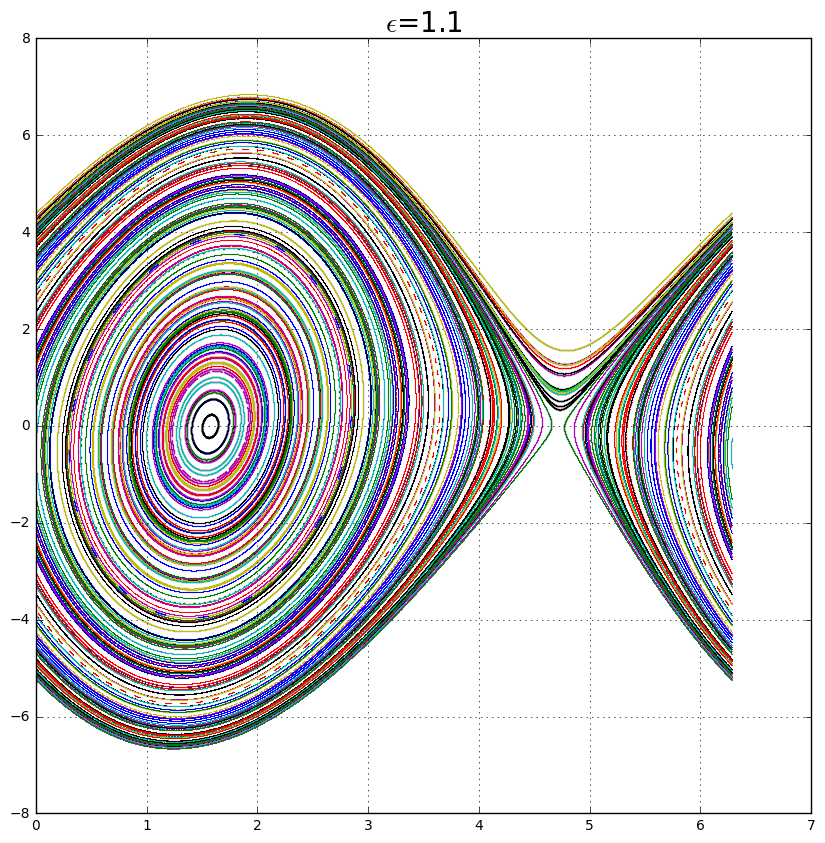

In [6]:
epsilon = array([0.01,0.05,0.1,0.2,0.3,0.4,0.7, 1.1])
tau = .1

for i in range(len(epsilon)):
        grafica =subplots(figsize=(10, 10))
        grid(True)
        title('$\epsilon$=%s'%epsilon[i],fontsize = 20)
        for j in range(200):
            pto = condiciones(pi/2)
            #plot(pto[0],pto[1],'o')
            sol = zeros([len(t),2])
            sol[0] = pto
            for j in range(len(t)-1):
                sol[j+1]= ec_mov(sol[j],tau,epsilon[i])
                if sol[j+1][0]>=(2*pi):
                     sol[j+1][0]=sol[j+1][0]%(2*pi)
                if sol[j+1][0]<0:
                    sol[j+1][0] = 2*pi+sol[j+1][0] 
            theta = [row[0] for row in sol]
            p = [row[1] for row in sol]
            plot(theta,p,'.',markersize = 0.5)
show()

En lo anterior podemos ver que cuando vamos cambiando $\epsilon$ las lineas empiezan a cambiar. Ya no tenemos valores constantes si no que la fuerza empieza a perturbar el sistema generando curvas cerradas alrededor de los puntos fijos. Mientras más nos alejemos de los puntos fijos, tendremos que las trayectorias van dejando de ser cerradas. Igualmente podemos notar que segun el valor de $\epsilon$ las trayectorias van a estar más juntas.

# Problema 2

## a)

Para poder ver si un sistema tiene orbitas cerradas lo que tenemos que hacer es ver que pasa con su energía y en partícular la energia potencial. Sabemos que $H=T+V$ por lo que del Hamiltoniano dado podemos obtener que:

$V(x,y) = \frac{1}{2}(x^2+y^2)+x^2y-\frac{1}{3}y^3$

Graficaremos entonces el potencial para ver que es lo que pasa.

In [7]:
def V(x,y):
    V = 0.5*(x**2+y**2)+x**2*y-1/3*y**3
    return V

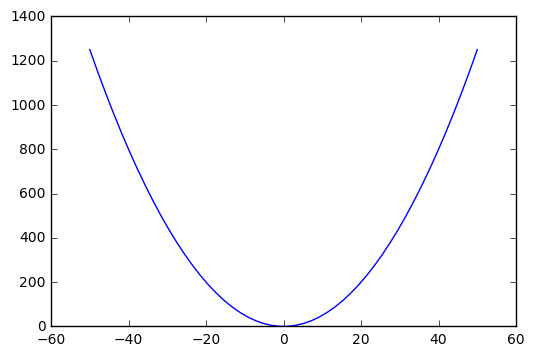

In [8]:
x = linspace(-50,50)
plot(x,V(x,0))

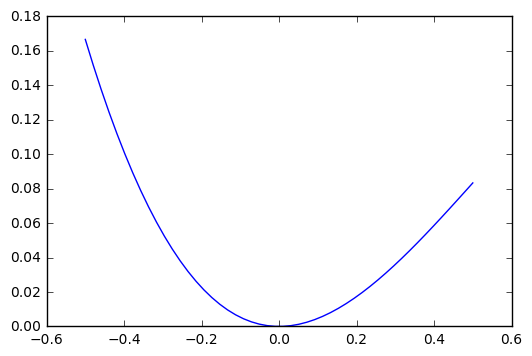

In [9]:
x = linspace(-.5,.5)
plot(x,V(0,x))

Lo que podemos notar es que la energía tiene un mínimo lo que nos dice que tenemos una trayectoria cerrada.

## b)

A continuación vamos a definir una función  para obtener la energía del sistema y otra que nos va a dar las condiciones iniciales que se piden para realizar la simulación.

In [10]:
def energia(x_p):
    E = .5*(x_p[2]**2+x_p[3]**2+x_p[1]**2+x_p[0]**2)-1/3*x_p[1]**3+x_p[0]**2*x_p[1]
    return E

In [11]:
def c_i(En=16):
    x,E = 0,3001
    while E>En:
        y = 50*(rand()-1)
        py =  50*(rand()-1)
        E =energia([0,y,0,py])
    return y,py  

Programamos ahora las ecuaciones de movimiento que son las mismas que se dan en el problema:

In [12]:
def ecuaciones_mov(x_p,t):
    dx = x_p[2]
    dy = x_p[3]
    dpx = -x_p[0]-2*x_p[0]*x_p[1]
    dpy = -x_p[1]-x_p[0]**2+x_p[1]**2
    return array([dx,dy,dpx,dpy])

Obtenemos ahora la trayectoria 

((-0.5, 0.5), (-0.5, 0.5))

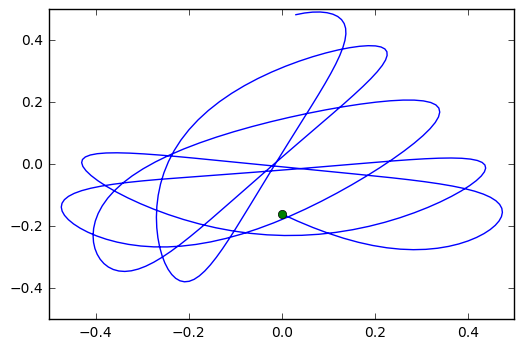

In [15]:
x = 0
E = .1
y,py =c_i(E)
cont_energia = energia([0,y,0,py])
px =sqrt(2*(E -cont_energia))
condiciones = array([x,y,px,py])


t =arange(0,30,.1)
pto_ini = condiciones
sol = odeint(ecuaciones_mov,pto_ini,t,atol=1e-19,rtol=1e-9)
plot(sol[:,0],sol[:,1])
plot(pto_ini[0],pto_ini[1],'o')
xlim([-0.5, 0.5]),ylim([-0.5, 0.5])

## c)

Hacemos ahora una funcion que nos de todas las raices de la trayectoria

In [16]:
def root_trayec(func,pto_i,ti,error=1e-5):
    while abs(pto_i[0])>error:
        tip1 = ti - (pto_i[0]/pto_i[2])
        paso = odeint(func,pto_i,[ti,tip1])
        ti,pto_i = tip1,paso[-1]
    return ti,pto_i

Lo aplicamos ahora a nuestra solución del inciso anterior

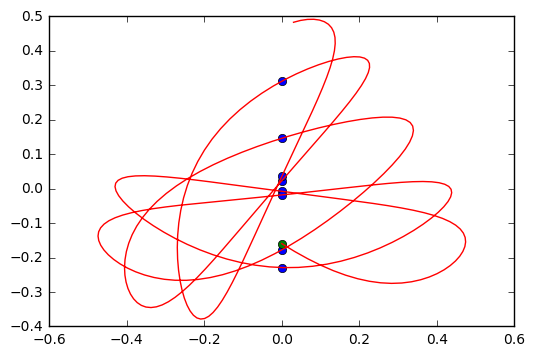

In [17]:
num = len(t)
raices = zeros(num)
puntos = zeros((num,4))
j=0
for i in range(len(t)-1):
    if (sol[i][0]*sol[i+1][0]) < 0:
        raices[j],puntos[j] = root_trayec(ecuaciones_mov,sol[i],t[i])
        j+=1
raices,puntos = raices[0:j],puntos[0:j]
plot(puntos[:,0],puntos[:,1],'o')
plot(pto_ini[0],pto_ini[1],'o')
plot(sol[:,0],sol[:,1])
show()

## d)

Ahora hacemos una función que cumpla con las condiciones inidiales y las 15 trayectorias.

In [19]:
def c_i2(n,En=16):   
    ci =zeros([n,4])
    for i in range(n):
        y = 0.1*(rand())
        px =  0.15*(rand()-1)
        cont_energia = energia([0,y,px,0])
        py =sqrt(2*(En -cont_energia))
        ci[i]=array([0,y,px,py])
    return ci

Y ahora obtenemos la simulacion tomando  $E=0.01,0.03,0.1.0.12,0.15,0.166$

/Users/valentina/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in sqrt


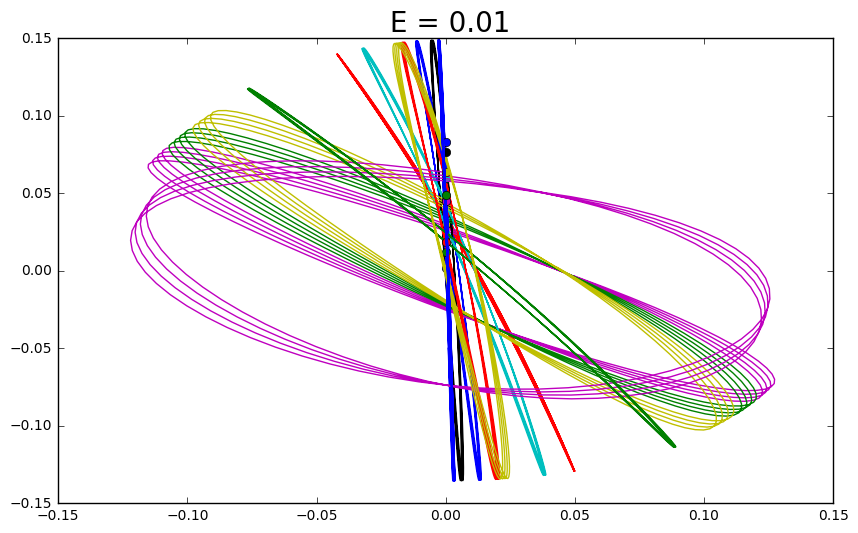

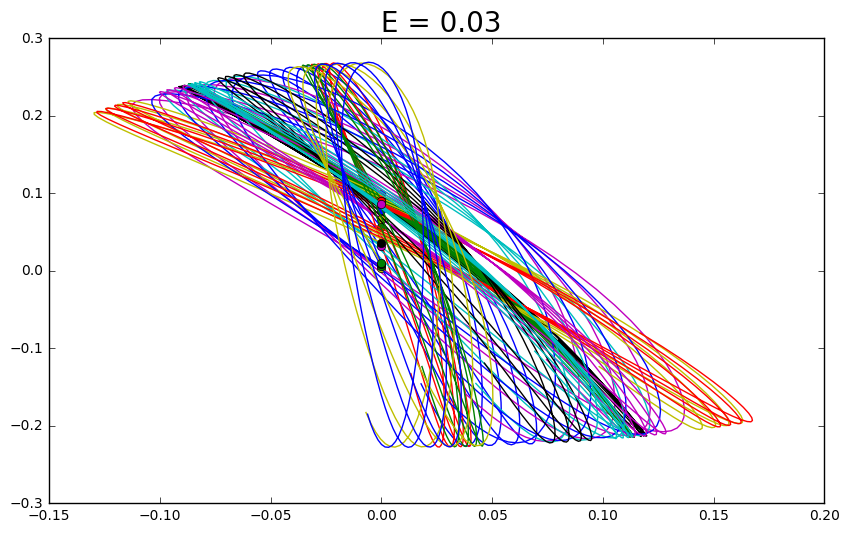

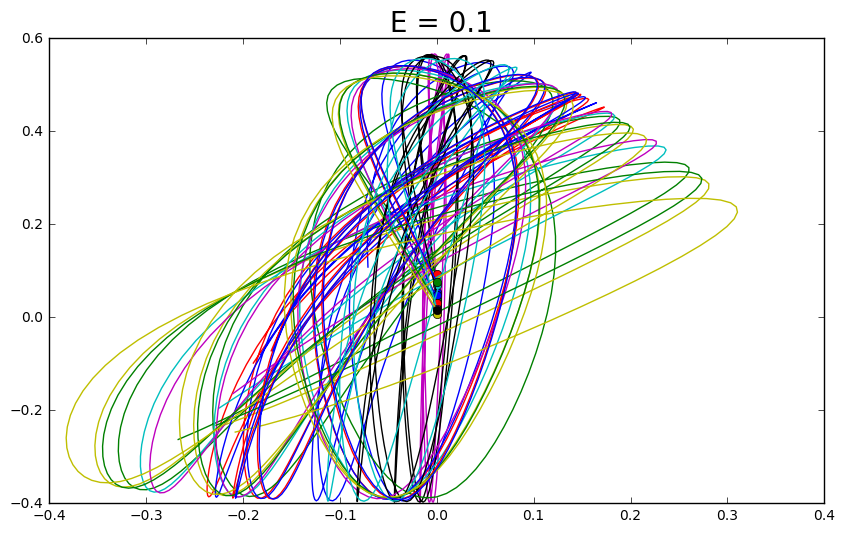

/Users/valentina/anaconda/lib/python3.5/site-packages/scipy/integrate/odepack.py:218: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


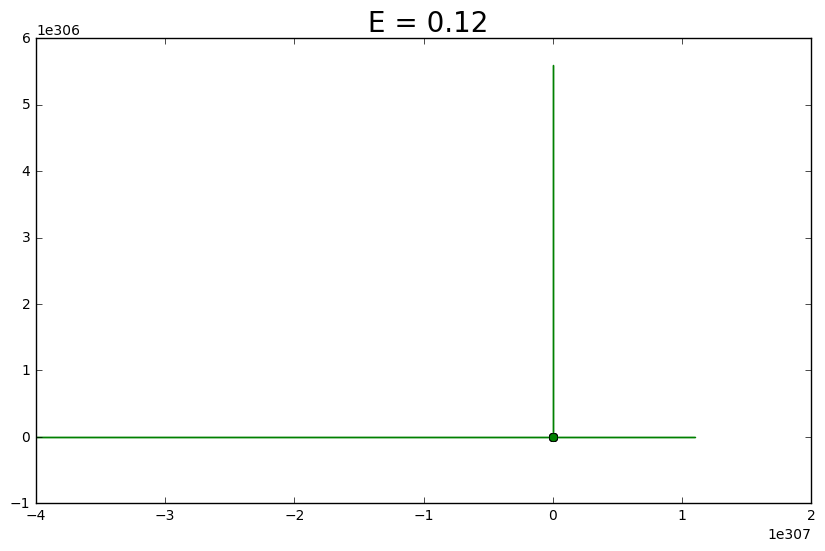

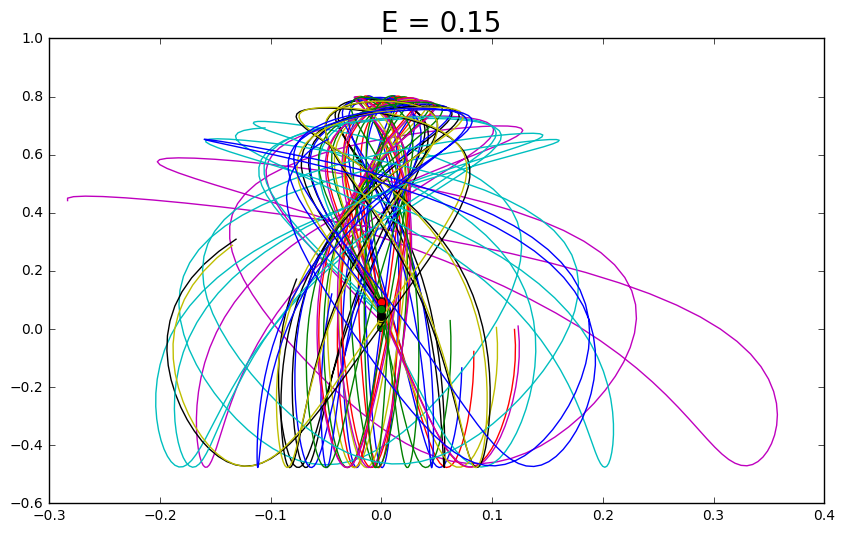

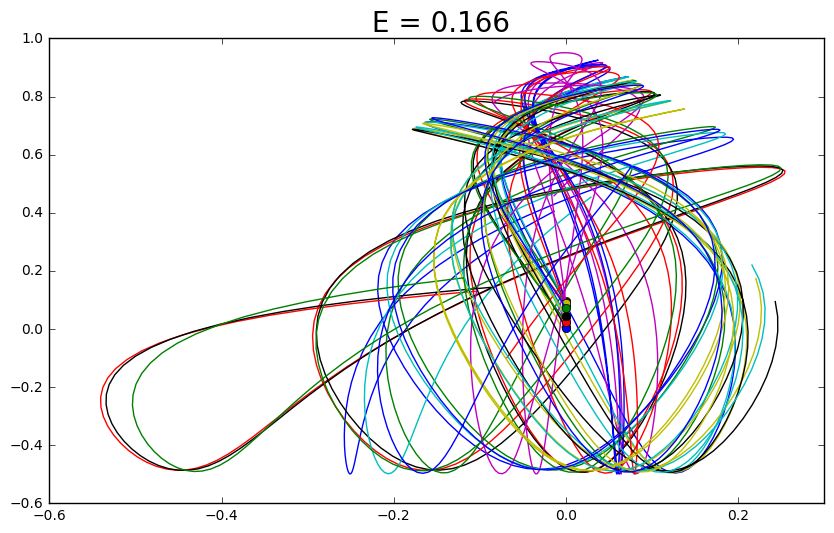

In [21]:
E = array([0.01,0.03,0.1,0.12,0.15,0.166])
t =arange(0,25,.1)
zoom=array([.2,0.3,0.3,0.5,.5,.5])
num_tray = 15
sol = []    
for i in range(len(E)): 
    grafica =subplots(figsize=(10, 6))
    solu =[]
    pto_ini = []
    for j in range(num_tray):
        pto_ini = c_i2(num_tray,E[i])[j]
        soluc = odeint(ecuaciones_mov,pto_ini,t,atol=1e-19,rtol=1e-9)
        plot(soluc[:,0],soluc[:,1])
        plot(pto_ini[0],pto_ini[1],'o')
        title(' E = %s'%E[i],fontsize = 20)
        solu.append(soluc)
    sol.append(solu)
    show()

graficamos ahora el espacio fase

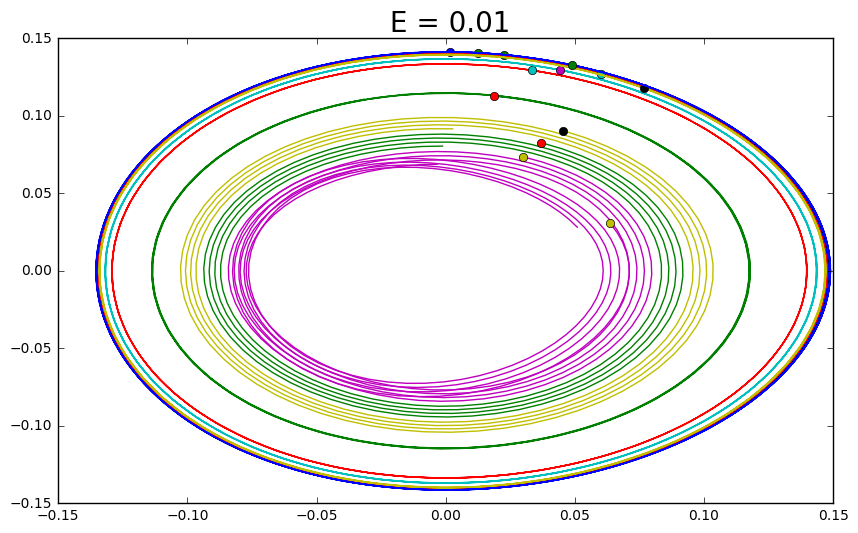

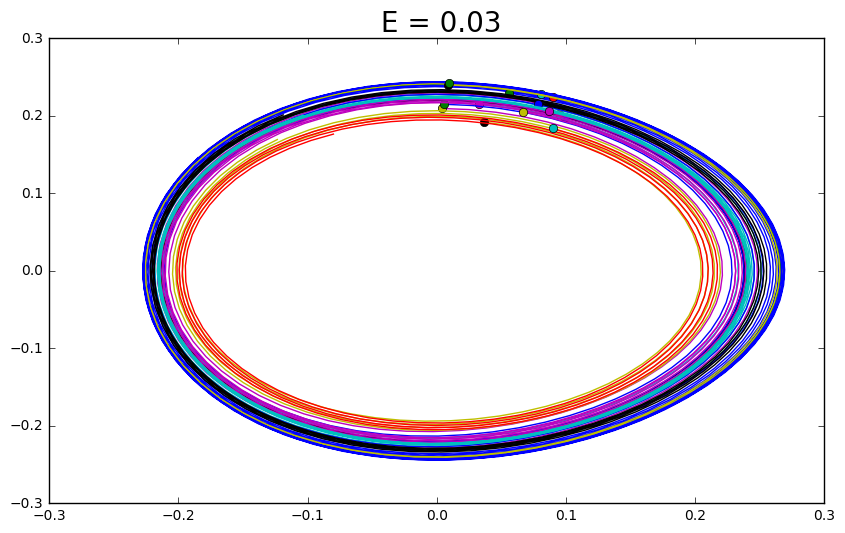

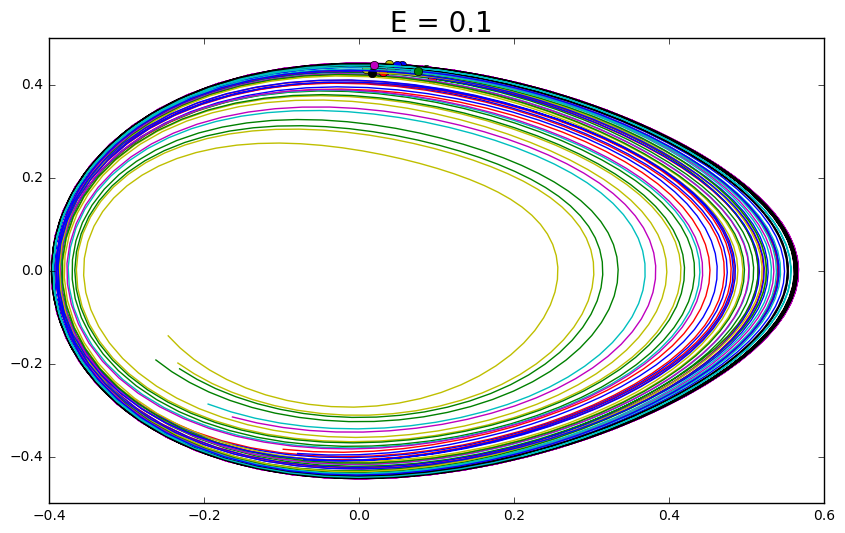

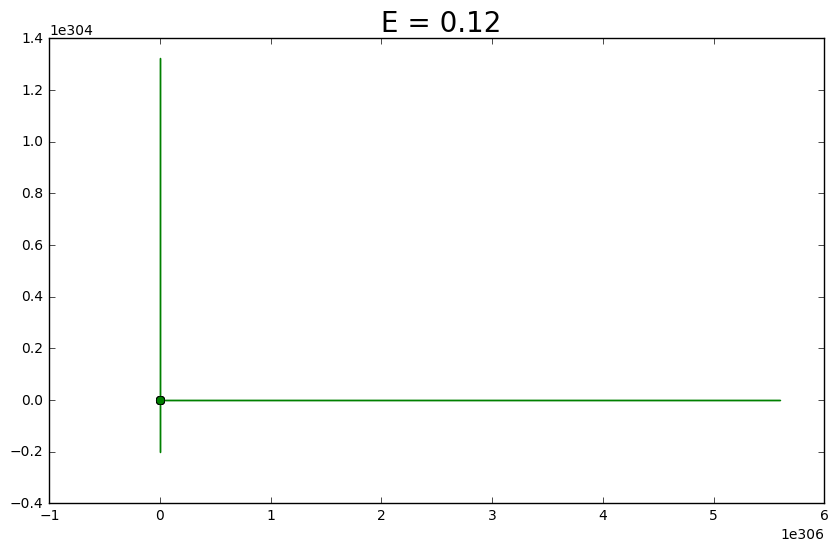

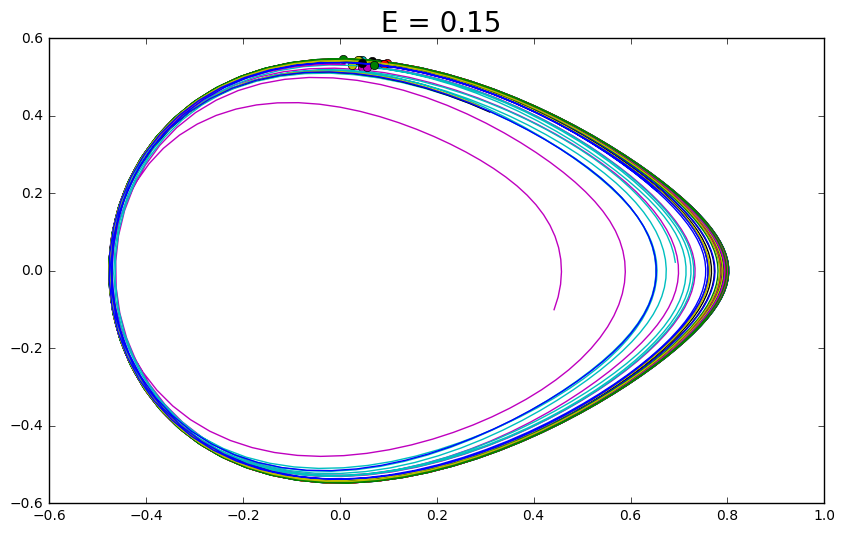

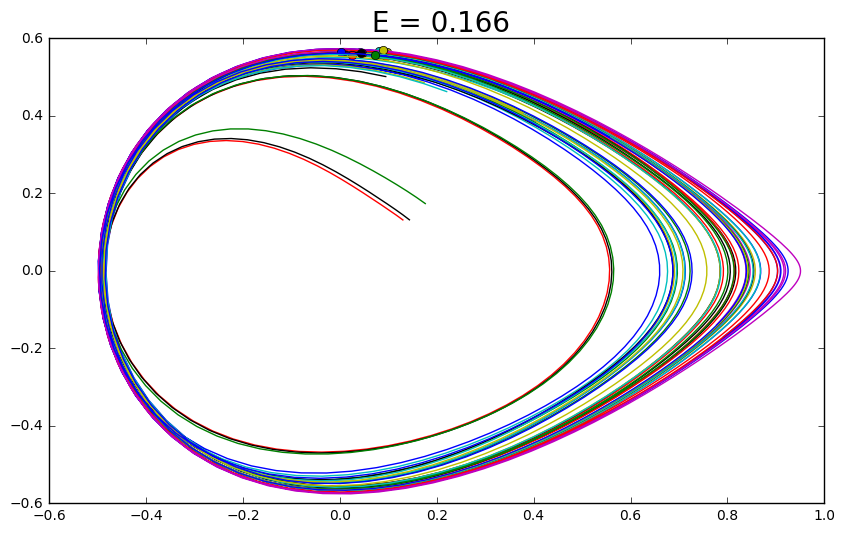

In [22]:
for i in range(len(E)):
    grafica =subplots(figsize=(10, 6))
    for j in range(num_tray):
        plot(sol[i][j][:,1],sol[i][j][:,3])
        title(' E = %s'%E[i],fontsize = 20)
        plot(sol[i][j][0,1],sol[i][j][0,3],'o')
    show()